In [1]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!pip install ninja
!pip install imageio-ffmpeg
!pip install -U -q PyDrive
!pip install lpips
!pip install pytorch_msssim
!pip install pytorch-ignite


from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

%mkdir raw_images
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch
%cd stylegan2-ada-pytorch
!git clone https://github.com/denkogit/stylegan2_models


!mkdir pretrained_models
%cd pretrained_models
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
!wget https://github.com/davisking/dlib-models/raw/master/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d /content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat.bz2

file_id = '1cUv_reLE6k3604or78EranS7XzuVMWeO' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('e4e_ffhq_encode.pt')


%cd ..

In [3]:
file_id = '1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('ms1mv3_arcface_r50_fp16.pth')

#### Собран датасет с фотографиями 4 знаменитостей: Бред Питт, Илон Маск, Роберт Дауни младший и Джефф Безос. Распакуем его.

In [ ]:
!unzip /content/my_celebs.zip -d /content/

#### Кадрируем изображения из собранного датасета

In [5]:
from utils import align_images

RAW_IMAGES_DIR = "/content/my_celebs"
ALIGNED_IMAGES_DIR = "/content/aligned_images"

align_images(RAW_IMAGES_DIR, ALIGNED_IMAGES_DIR)

In [ ]:
!zip -r /content/aligned_images.zip /content/aligned_images

#### Покажем по 1 примеру фото каждой из знаменитостей. Возьмем их для дальнейшей работы.

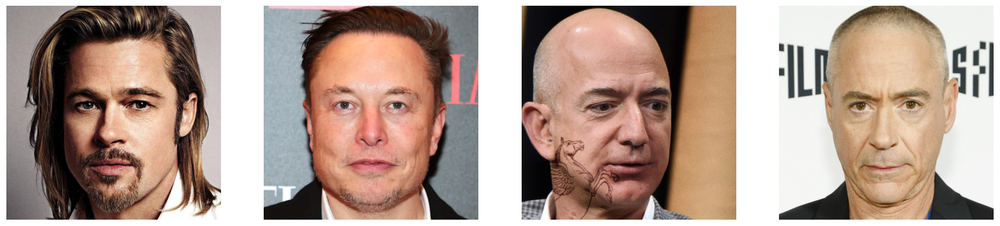

In [8]:
import os
import random
from utils import showImages

CELEBS = ["BradPitt", "ElonMusk", "JeffBezos", "RobertDowney"]

images_paths = [os.path.join(ALIGNED_IMAGES_DIR, celeb, f"{random.randint(0, 3)}.jpg") for celeb in CELEBS]

showImages(images_paths)

### Найдем проекции изображений в пространтсве StyleGAN

#### **1 Способ**: Комбинация лоссов.

In [ ]:
from utils import create_loss_projections

PROJECTED_IMAGES_V1_DIR = "/content/image_projections_v1/"
os.makedirs(PROJECTED_IMAGES_V1_DIR, exist_ok=True)

create_loss_projections(images_paths, PROJECTED_IMAGES_V1_DIR)

In [ ]:
!zip -r /content/image_projections_v1.zip /content/image_projections_v1

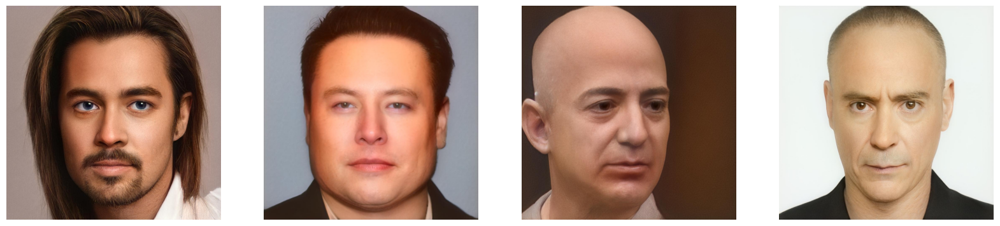

In [ ]:
projected_images_v1_names = os.listdir(PROJECTED_IMAGES_V1_DIR)

if ".ipynb_checkpoints" in projected_images_v1_names:
  projected_images_v1_names.remove(".ipynb_checkpoints")

projected_images_v1_names = sorted(projected_images_v1_names, key = lambda x : x.split(".")[0])

projected_images_v1 = [os.path.join(PROJECTED_IMAGES_V1_DIR, image_path) for image_path in projected_images_v1_names]

showImages(projected_images_v1)

Такой подход сглаживает все неровности кожи и морщины, омолаживая персонажей. Люди становятся мало похожи на себя.

#### **2 Способ**: Энкодер.

In [ ]:
from utils import create_encoder_projections

PROJECTED_IMAGES_V2_DIR = "/content/image_projections_v2/"
os.makedirs(PROJECTED_IMAGES_V2_DIR, exist_ok=True)

initial_latent_vectors = create_encoder_projections(images_paths, PROJECTED_IMAGES_V2_DIR)

In [ ]:
!zip -r /content/image_projections_v2.zip /content/image_projections_v2

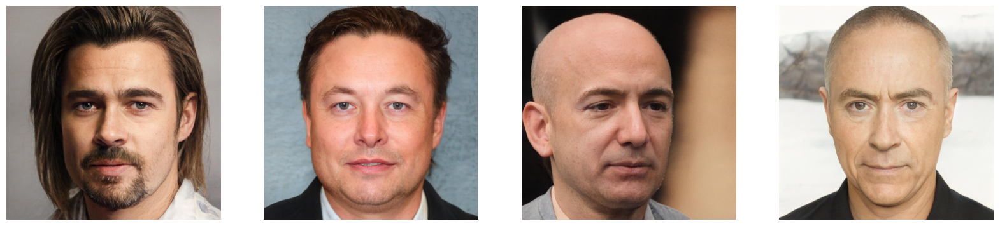

In [ ]:
projected_images_v2_names = os.listdir(PROJECTED_IMAGES_V2_DIR)

if ".ipynb_checkpoints" in projected_images_v2_names:
  projected_images_v2_names.remove(".ipynb_checkpoints")

projected_images_v2_names = sorted(projected_images_v2_names, key = lambda x : x.split(".")[0])

projected_images_v2 = [os.path.join(PROJECTED_IMAGES_V2_DIR, image_path) for image_path in projected_images_v2_names]

showImages(projected_images_v2)

2 Способ сильно лучше, энкодер сохранил некоторые следы старости и знаменитости в основном похожи на себя.

#### **3 Способ**: Оптимизация комбинации лосов с помощью начального латентного вектора - выхода энкодера.

In [ ]:
PROJECTED_IMAGES_V3_DIR = "/content/image_projections_v3/"
os.makedirs(PROJECTED_IMAGES_V3_DIR, exist_ok=True)

create_loss_projections(images_paths, PROJECTED_IMAGES_V3_DIR, encoder_optim=True, init_latent_vectors=initial_latent_vectors)

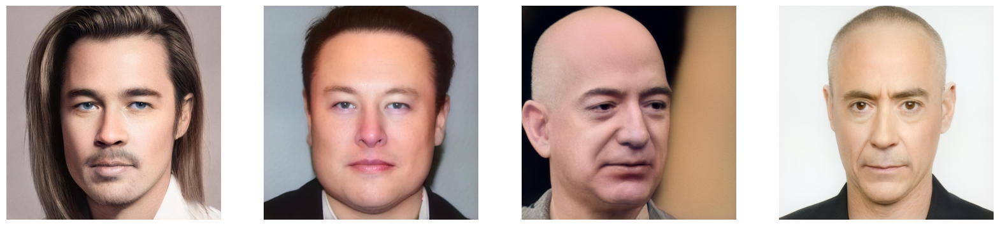

In [ ]:
projected_images_v3_names = os.listdir(PROJECTED_IMAGES_V3_DIR)

if ".ipynb_checkpoints" in projected_images_v3_names:
  projected_images_v3_names.remove(".ipynb_checkpoints")

projected_images_v3_names = sorted(projected_images_v3_names, key = lambda x : x.split(".")[0])

projected_images_v3 = [os.path.join(PROJECTED_IMAGES_V3_DIR, image_path) for image_path in projected_images_v3_names]

showImages(projected_images_v3)

По сравнению с 1 способом получилось лучше только для Безоса. Качество хуже чем во 2 способе, поэтому будем использовать 2 способ для проекции оригинальных фото.

### Style Transfer

In [ ]:
!unzip /content/styles.zip -d /content/

Посмотрим, как выглядят стили


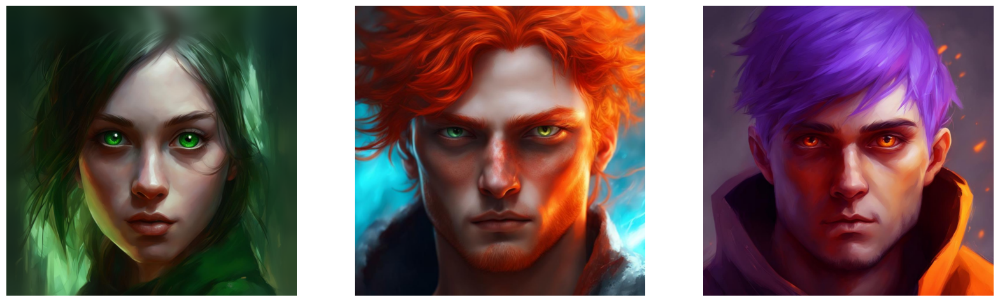

In [ ]:
STYLES_DIR = "/content/styles"

STYLES_ALIGN_DIR = "/content/aligned_styles"

align_images(STYLES_DIR, STYLES_ALIGN_DIR)

styles_names = os.listdir(os.path.join(STYLES_ALIGN_DIR, "styles"))
styles_paths = [os.path.join(STYLES_ALIGN_DIR, "styles", style_name) for style_name in styles_names]

showImages(styles_paths)

Прогоним их через энкодер, чтобы получить латентные вектора.

In [ ]:
import torch
import numpy as np
from PIL import Image
from utils import device, G, image2e4etensor
from stylegan2_models.e4e.model_utils import load_e4e_standalone


e4e_model, _ = load_e4e_standalone("/content/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt")

PROJECTED_STYLES_V1_DIR = "/content/styles_projections_v1/"
os.makedirs(PROJECTED_STYLES_V1_DIR, exist_ok=True)

style_latent_vectors = create_encoder_projections(styles_paths, PROJECTED_STYLES_V1_DIR)

Посмотрим на генерации на основе проекций стилей

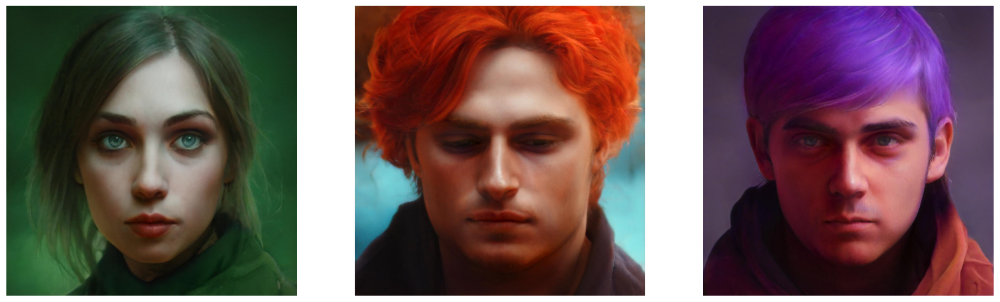

In [ ]:
projected_styles_names = os.listdir(PROJECTED_STYLES_V1_DIR)

if ".ipynb_checkpoints" in projected_styles_names:
  projected_styles_names.remove(".ipynb_checkpoints")

projected_styles_names = sorted(projected_styles_names, key = lambda x : x.split(".")[0])

projected_styles = [os.path.join(PROJECTED_STYLES_V1_DIR, style_path) for style_path in projected_styles_names]

showImages(projected_styles)

Проекции сохранили цвет волос и пол.

Попробуем изменить стиль знаменитостей. Возьмем фото Бреда Питта и попробуем заменить различные срезы в его латентном векторе срезом из стиля c шагом в 1 вектор.

In [ ]:
BRAD_PITT_SLICES_DIR = "/content/BradPittSlices/"
os.makedirs(BRAD_PITT_SLICES_DIR, exist_ok=True)

celeb_latent_vector = initial_latent_vectors[0]
style_latent_vector = style_latent_vectors[1]

indices_pairs = [(i, 18) for i in range(18)]

for indices_pair in indices_pairs:

    start, end = indices_pair

    merged_latent_vector = torch.zeros((1, 18, 512))

    merged_latent_vector[:,0:start,:] = celeb_latent_vector[:,0:start,:]
    merged_latent_vector[:,start:end,:] = style_latent_vector[:,start:end,:]

    generated_tensor = G.synthesis(merged_latent_vector.to(device), noise_mode='const', force_fp32=True)
    generated_tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(generated_tensor[0].detach().cpu().numpy(), 'RGB')
    img.save(os.path.join(BRAD_PITT_SLICES_DIR, f"{start}-{end}.jpg"))

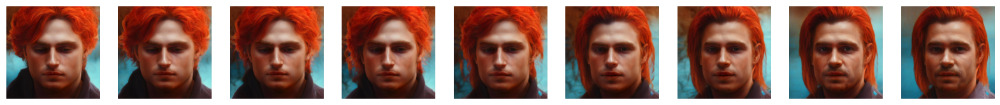

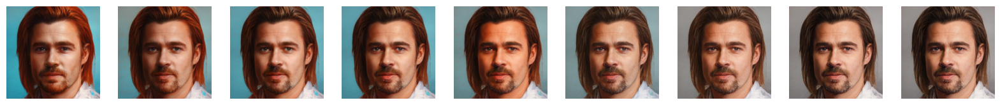

In [ ]:
brad_pitt_mixes = os.listdir(BRAD_PITT_SLICES_DIR)

if ".ipynb_checkpoints" in brad_pitt_mixes:
  brad_pitt_mixes.remove(".ipynb_checkpoints")

brad_pitt_mixes = sorted(brad_pitt_mixes, key = lambda x : int(x.split("-")[0]))

brad_pitt_imgs = [os.path.join(BRAD_PITT_SLICES_DIR, path) for path in brad_pitt_mixes]

showImages(brad_pitt_imgs[:len(brad_pitt_imgs) // 2])
showImages(brad_pitt_imgs[len(brad_pitt_imgs) // 2:])

Если изначально взять за основу вектора стилей, то заменяя в них вектора на вектора оригинального фото, сначала меняется угол наклона головы, затем меняется выражение и форма лица, и чем дальше мы идем, тем больше теряются черты стиля и приобретаются детали оригинального фото. Так как человек должен остаться похожим на себя, выглядит неплохим вариантом взять из стиля вектора с 9 по 18.

In [ ]:
START_IND = 9
END_IND = 18

Изменим стиль, например, для Бреда Питта и Роберта Дауни Младшего.

#### Бред Питт

In [ ]:
BRAD_PITT_DIR = "/content/BradPittStyles/"
os.makedirs(BRAD_PITT_DIR, exist_ok=True)

celeb_latent_vector = initial_latent_vectors[0]

for i, style_latent_vector in enumerate(style_latent_vectors, start=1):

    merged_latent_vector = torch.zeros((1, 18, 512))

    merged_latent_vector[:,0:START_IND,:] = celeb_latent_vector[:,0:START_IND,:]
    merged_latent_vector[:,START_IND:END_IND,:] = style_latent_vector[:,START_IND:END_IND,:]

    generated_tensor = G.synthesis(merged_latent_vector.to(device), noise_mode='const', force_fp32=True)
    generated_tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(generated_tensor[0].detach().cpu().numpy(), 'RGB')
    img.save(os.path.join(BRAD_PITT_DIR, f"{i}_style_{START_IND}-{END_IND}.jpg"))

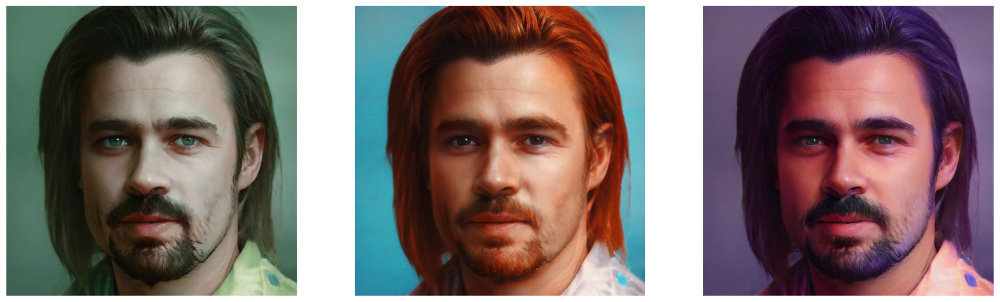

In [ ]:
mixes = os.listdir(BRAD_PITT_DIR)

if ".ipynb_checkpoints" in mixes:
  mixes.remove(".ipynb_checkpoints")

mixes = sorted(mixes, key = lambda x : int(x.split("_")[0]))

imgs = [os.path.join(BRAD_PITT_DIR, path) for path in mixes]

showImages(imgs)

#### Роберт Дауни Младший

In [ ]:
ROBERT_DOWNEY_DIR = "/content/RobertDowneyStyles/"
os.makedirs(ROBERT_DOWNEY_DIR, exist_ok=True)

celeb_latent_vector = initial_latent_vectors[3]

for i, style_latent_vector in enumerate(style_latent_vectors, start=1):

    merged_latent_vector = torch.zeros((1, 18, 512))

    merged_latent_vector[:,0:START_IND,:] = celeb_latent_vector[:,0:START_IND,:]
    merged_latent_vector[:,START_IND:END_IND,:] = style_latent_vector[:,START_IND:END_IND,:]

    generated_tensor = G.synthesis(merged_latent_vector.to(device), noise_mode='const', force_fp32=True)
    generated_tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(generated_tensor[0].detach().cpu().numpy(), 'RGB')
    img.save(os.path.join(ROBERT_DOWNEY_DIR, f"{i}_style_{START_IND}-{END_IND}.jpg"))

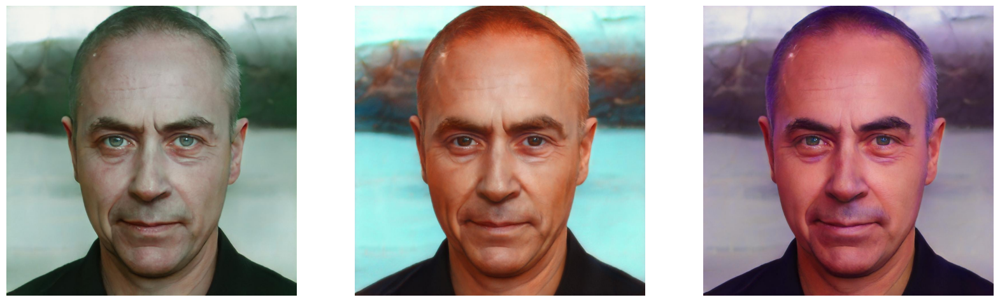

In [ ]:
mixes = os.listdir(ROBERT_DOWNEY_DIR)

if ".ipynb_checkpoints" in mixes:
  mixes.remove(".ipynb_checkpoints")

mixes = sorted(mixes, key = lambda x : int(x.split("_")[0]))

imgs = [os.path.join(ROBERT_DOWNEY_DIR, path) for path in mixes]

showImages(imgs)

### Expression transfer


In [ ]:
!unzip /content/emotions.zip -d /content/

In [ ]:
!rm -rf /content/emotions

Посмотрим, какие эмоции собрали.

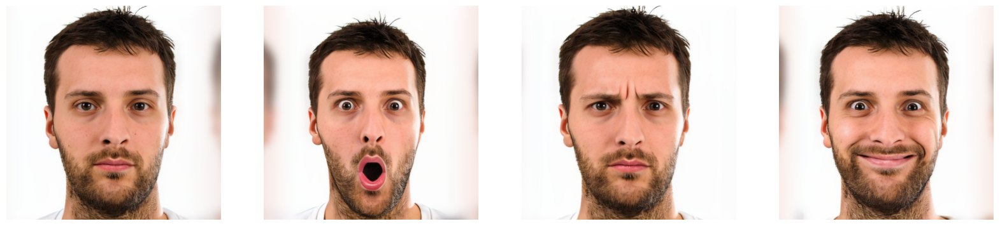

In [ ]:
EMOTIONS_DIR = "/content/emotions/"

EMOTIONS_ALIGN_DIR = "/content/aligned_emotions"

align_images(EMOTIONS_DIR, EMOTIONS_ALIGN_DIR)

emotion_names = os.listdir(os.path.join(EMOTIONS_ALIGN_DIR, "emotions"))

if ".ipynb_checkpoints" in emotion_names:
  emotion_names.remove(".ipynb_checkpoints")

emotion_names = sorted(emotion_names, key = lambda x : int(x.split(".")[0]))
emotions_paths = [os.path.join(EMOTIONS_ALIGN_DIR, "emotions", emotion_name) for emotion_name in emotion_names]

showImages(emotions_paths)

1. Нейтральное состояние
2. Удивление
3. Замешательство
4. Радость

Прогоним их через энкодер, чтобы получить латентные вектора.

In [ ]:
PROJECTED_EMOTIONS_DIR = "/content/emotions_projections/"
os.makedirs(PROJECTED_EMOTIONS_DIR, exist_ok=True)

emotion_latent_vectors = []

for i, emotion_path in enumerate(emotions_paths, start=1):

  print(f"Start processing emotion № {i}")
  target_pil = Image.open(emotion_path).convert('RGB')
  target_uint8 = np.array(target_pil, dtype=np.uint8)
  e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
  initial_latent_vector = e4e_model(e4e_tensor)
  emotion_latent_vectors.append(initial_latent_vector)
  generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
  generated_tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  img = Image.fromarray(generated_tensor[0].detach().cpu().numpy(), 'RGB')
  img.save(os.path.join(PROJECTED_EMOTIONS_DIR, f"{i}.jpg"))

Посмотрим на генерации на основе проекций эмоций.

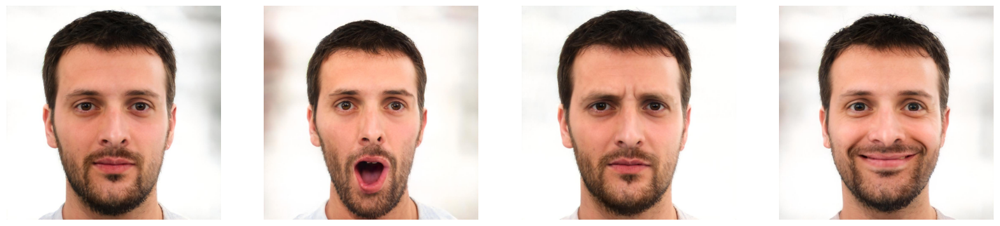

In [ ]:
projected_emotions_names = os.listdir(PROJECTED_EMOTIONS_DIR)

if ".ipynb_checkpoints" in projected_emotions_names:
  projected_emotions_names.remove(".ipynb_checkpoints")

projected_emotions_names = sorted(projected_emotions_names, key = lambda x : x.split(".")[0])

projected_emotions = [os.path.join(PROJECTED_EMOTIONS_DIR, emotion_path) for emotion_path in projected_emotions_names]

showImages(projected_emotions)

Испуг немного спестился в сторону безудержной радости, но и на оригинальном фото актер, если честно, отыграл не очень.

Подготовим разности в векторах для переноса эмоций.

In [ ]:
emotions_vec = {
    "surprise" : emotion_latent_vectors[1] - emotion_latent_vectors[0],
    "confused" : emotion_latent_vectors[2] - emotion_latent_vectors[0],
    "happiness" : emotion_latent_vectors[3] - emotion_latent_vectors[0],
}

lambdas = [0., 0.25, 0.5, 0.75, 1]

Попробуем натянуть эмоции на Джеффа Безоса и Илона Маска

Начнем с Маска.

In [ ]:
ELON_MUSK_DIR = "/content/ElonMuskEmotions/"
os.makedirs(ELON_MUSK_DIR, exist_ok=True)

musk_vec = initial_latent_vectors[1]

for emotion in emotions_vec:
  for l in lambdas:
    generated_tensor = G.synthesis(musk_vec + l * emotions_vec[emotion], noise_mode='const', force_fp32=True)
    generated_tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(generated_tensor[0].detach().cpu().numpy(), 'RGB')
    img.save(os.path.join(ELON_MUSK_DIR, f"{l}_{emotion}.jpg"))

Радость Илона Маска

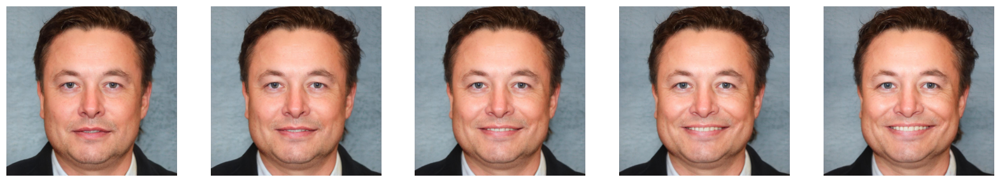

In [ ]:
musk_happiness = list(filter(lambda x : "happiness" in x, os.listdir(ELON_MUSK_DIR)))

musk_happiness = sorted(musk_happiness, key = lambda x : float(x.split("_")[0]))

musk_happiness = [os.path.join(ELON_MUSK_DIR, img) for img in musk_happiness]

showImages(musk_happiness)

Замешательство Илона Маска

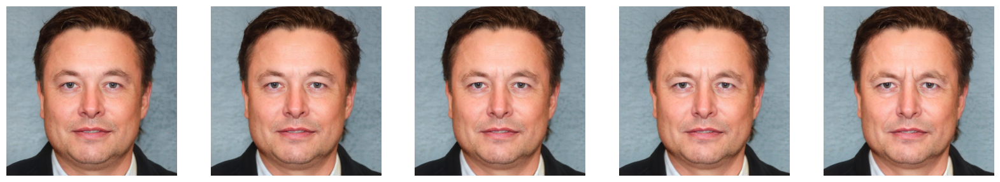

In [ ]:
musk_confusion = list(filter(lambda x : "confused" in x, os.listdir(ELON_MUSK_DIR)))

musk_confusion = sorted(musk_confusion, key = lambda x : float(x.split("_")[0]))

musk_confusion = [os.path.join(ELON_MUSK_DIR, img) for img in musk_confusion]

showImages(musk_confusion)

Удивление Илона Маска

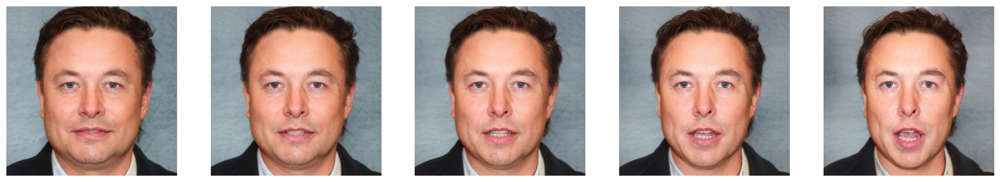

In [ ]:
musk_surprised = list(filter(lambda x : "surprise" in x, os.listdir(ELON_MUSK_DIR)))

musk_surprised = sorted(musk_surprised, key = lambda x : float(x.split("_")[0]))

musk_surprised = [os.path.join(ELON_MUSK_DIR, img) for img in musk_surprised]

showImages(musk_surprised)

Продолжим с Джеффом Безосом.

In [ ]:
JEFF_BEZOS_DIR = "/content/JeffBezosEmotions/"
os.makedirs(JEFF_BEZOS_DIR, exist_ok=True)

bezos_vec = initial_latent_vectors[2]

for emotion in emotions_vec:
  for l in lambdas:
    generated_tensor = G.synthesis(bezos_vec + l * emotions_vec[emotion], noise_mode='const', force_fp32=True)
    generated_tensor = (generated_tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(generated_tensor[0].detach().cpu().numpy(), 'RGB')
    img.save(os.path.join(JEFF_BEZOS_DIR, f"{l}_{emotion}.jpg"))

Радость Джеффа Безоса

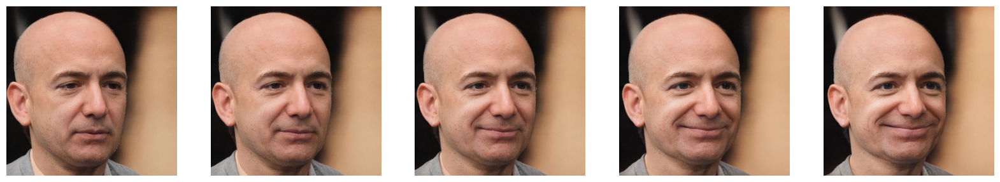

In [ ]:
bezos_happiness = list(filter(lambda x : "happiness" in x, os.listdir(JEFF_BEZOS_DIR)))

bezos_happiness = sorted(bezos_happiness, key = lambda x : float(x.split("_")[0]))

bezos_happiness = [os.path.join(JEFF_BEZOS_DIR, img) for img in bezos_happiness]

showImages(bezos_happiness)

Замешательство Джеффа Безоса

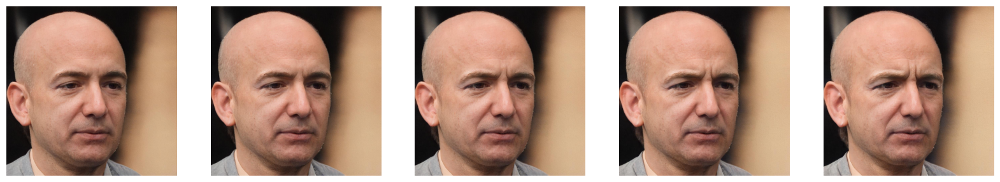

In [ ]:
bezos_confusion = list(filter(lambda x : "confused" in x, os.listdir(JEFF_BEZOS_DIR)))

bezos_confusion = sorted(bezos_confusion, key = lambda x : float(x.split("_")[0]))

bezos_confusion = [os.path.join(JEFF_BEZOS_DIR, img) for img in bezos_confusion]

showImages(bezos_confusion)

Удивление Джеффа Безоса

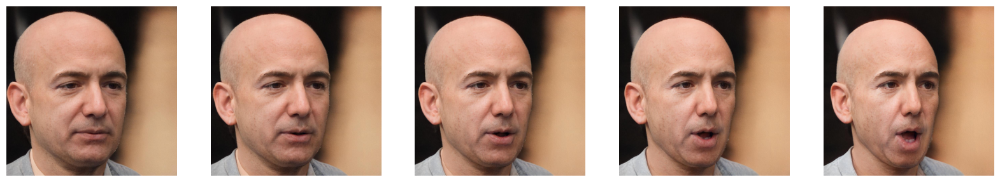

In [ ]:
bezos_surprised = list(filter(lambda x : "surprise" in x, os.listdir(JEFF_BEZOS_DIR)))

bezos_surprised = sorted(bezos_surprised, key = lambda x : float(x.split("_")[0]))

bezos_surprised = [os.path.join(JEFF_BEZOS_DIR, img) for img in bezos_surprised]

showImages(bezos_surprised)

### Face swap

In [10]:
from utils import arcface_train

FACE_SWAP_DIR = "/content/FaceSwap/"
os.makedirs(FACE_SWAP_DIR, exist_ok=True)

brad_pitt = images_paths[0]
elon_musk = images_paths[1]
jeff_bezos = images_paths[2]
robert_downey = images_paths[3]

Натянем на Бреда Пита

In [ ]:
arcface_train(from_img=brad_pitt, to_img=elon_musk, save_path=os.path.join(FACE_SWAP_DIR, "pitt_to_musk.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[0], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=brad_pitt, to_img=jeff_bezos, save_path=os.path.join(FACE_SWAP_DIR, "pitt_to_bezos.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[0], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=brad_pitt, to_img=robert_downey, save_path=os.path.join(FACE_SWAP_DIR, "pitt_to_downey.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[0], lpips_weight=5, arcface_weight=0.5)

Лица слева направо: Илон Маск, Роберт Дауни Младший, Джефф Безос.

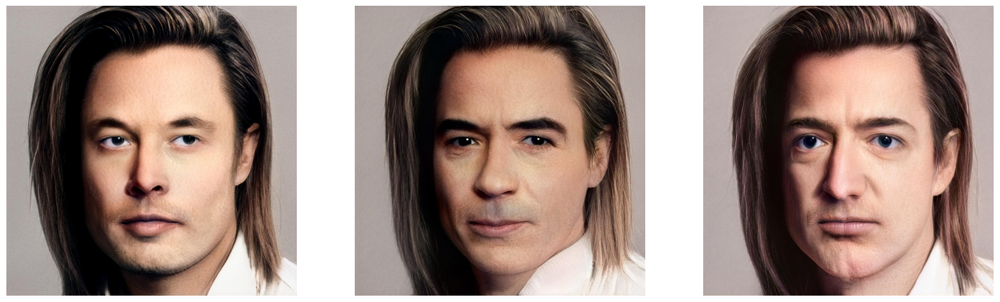

In [ ]:
pitt_trans = list(filter(lambda x : "pitt_to" in x, os.listdir(FACE_SWAP_DIR)))

pitt_imgs = [os.path.join(FACE_SWAP_DIR, img) for img in pitt_trans]

showImages(pitt_imgs)

Натянем на Илона Маска

In [ ]:
arcface_train(from_img=elon_musk, to_img=brad_pitt, save_path=os.path.join(FACE_SWAP_DIR, "musk_to_pitt.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[1], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=elon_musk, to_img=jeff_bezos, save_path=os.path.join(FACE_SWAP_DIR, "musk_to_bezos.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[1], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=elon_musk, to_img=robert_downey, save_path=os.path.join(FACE_SWAP_DIR, "musk_to_downey.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[1], lpips_weight=5, arcface_weight=0.5)

Лица слева направо: Роберт Дауни Младший, Джефф Безос, Бред Питт.

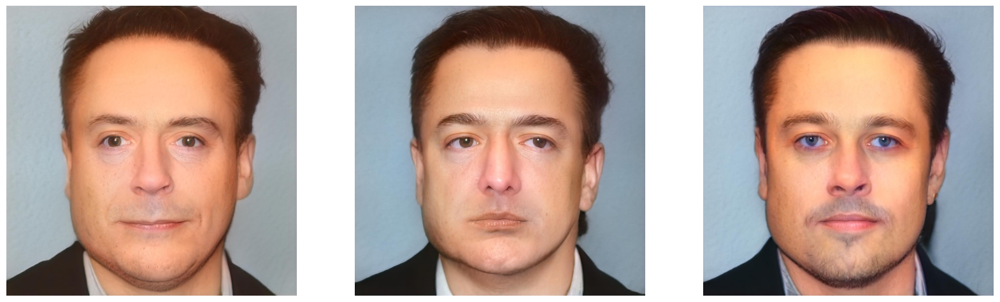

In [ ]:
musk_trans = list(filter(lambda x : "musk_to" in x, os.listdir(FACE_SWAP_DIR)))

musk_imgs = [os.path.join(FACE_SWAP_DIR, img) for img in musk_trans]

showImages(musk_imgs)

Натянем на Джеффа Безоса

In [ ]:
arcface_train(from_img=jeff_bezos, to_img=brad_pitt, save_path=os.path.join(FACE_SWAP_DIR, "bezos_to_pitt.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[2], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=jeff_bezos, to_img=elon_musk, save_path=os.path.join(FACE_SWAP_DIR, "bezos_to_musk.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[2], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=jeff_bezos, to_img=robert_downey, save_path=os.path.join(FACE_SWAP_DIR, "bezos_to_downey.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[2], lpips_weight=5, arcface_weight=0.5)

Лица слева направо: Роберт Дауни Младший, Илон Маск, Бред Питт.

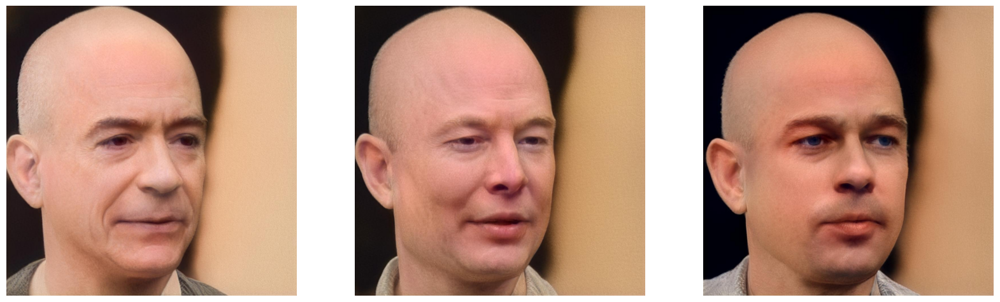

In [12]:
bezos_trans = list(filter(lambda x : "bezos_to" in x, os.listdir(FACE_SWAP_DIR)))

bezos_imgs = [os.path.join(FACE_SWAP_DIR, img) for img in bezos_trans]

showImages(bezos_imgs)

Натянем на Роберта Дауни Младшего

In [ ]:
arcface_train(from_img=robert_downey, to_img=brad_pitt, save_path=os.path.join(FACE_SWAP_DIR, "downey_to_pitt.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[3], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=robert_downey, to_img=elon_musk, save_path=os.path.join(FACE_SWAP_DIR, "downey_to_musk.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[3], lpips_weight=5, arcface_weight=0.5)
arcface_train(from_img=robert_downey, to_img=jeff_bezos, save_path=os.path.join(FACE_SWAP_DIR, "downey_to_bezos.jpg"), encoder_optim=True, init_latent_vector=initial_latent_vectors[3], lpips_weight=5, arcface_weight=0.5)

Лица слева направо: Берд Питт, Джефф Безос, Илон Маск.

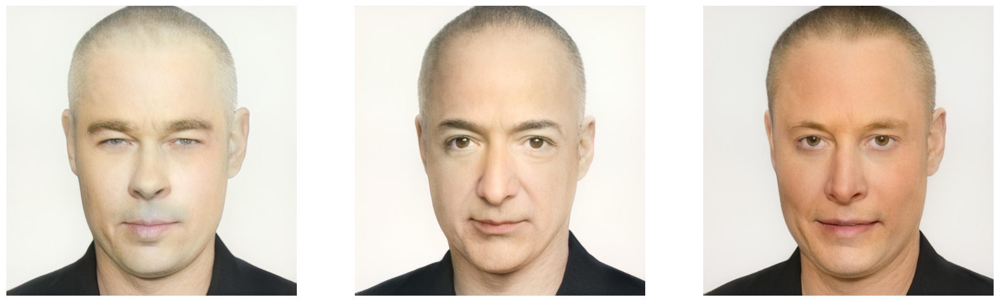

In [14]:
downey_trans = list(filter(lambda x : "downey_to" in x, os.listdir(FACE_SWAP_DIR)))

downey_imgs = [os.path.join(FACE_SWAP_DIR, img) for img in downey_trans]

showImages(downey_imgs)